In [1]:
!pip install pandas
!pip install pyarrow #development platform for in-memory analytics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.path as mpl_path
import matplotlib
import seaborn as sns
import json
from collections import defaultdict

#Question 1

Write a python class called ProcessGameState that will accomplish the
following:

- Handle file ingestion and ETL (if deemed necessary)
- Return whether or not each row falls within a provided boundary
 - Be as efficient as possible (minimize runtime)
 - Reduce dependencies outside of standard Python libraries unless
you can prove significant improvements.
- Extract the weapon classes from the inventory json column

<class 'pandas.core.frame.DataFrame'>
Int64Index: 221330 entries, 0 to 221329
Data columns (total 22 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   round_num                       221330 non-null  int64  
 1   tick                            221330 non-null  int64  
 2   side                            221330 non-null  object 
 3   team                            221330 non-null  object 
 4   hp                              221330 non-null  int64  
 5   armor                           221330 non-null  int64  
 6   is_alive                        221330 non-null  bool   
 7   x                               221330 non-null  int64  
 8   y                               221330 non-null  int64  
 9   z                               221330 non-null  int64  
 10  inventory                       173850 non-null  object 
 11  total_utility                   221330 non-null  float64
 12  equipment_value_

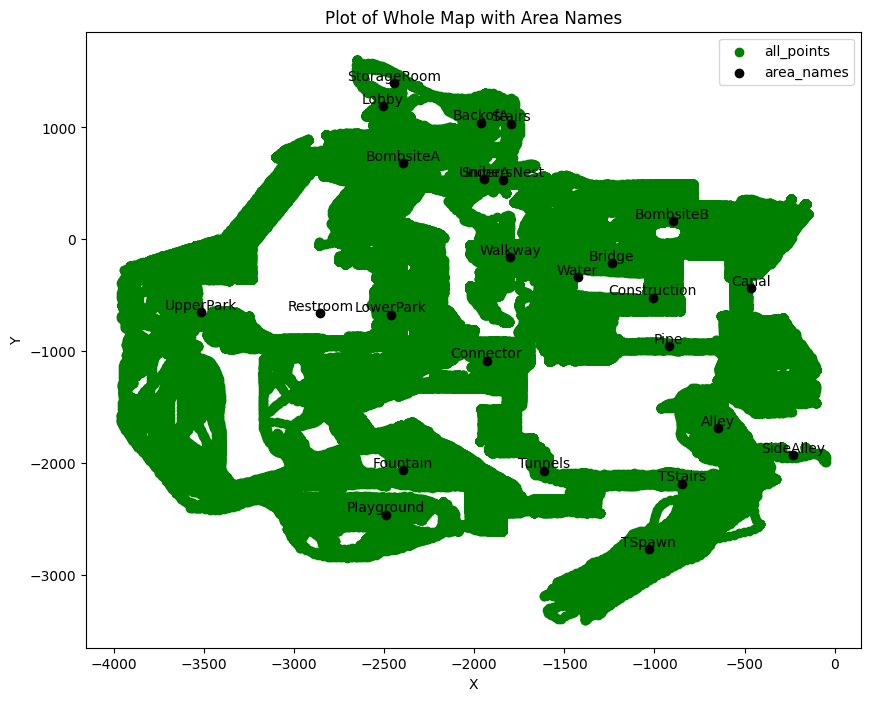

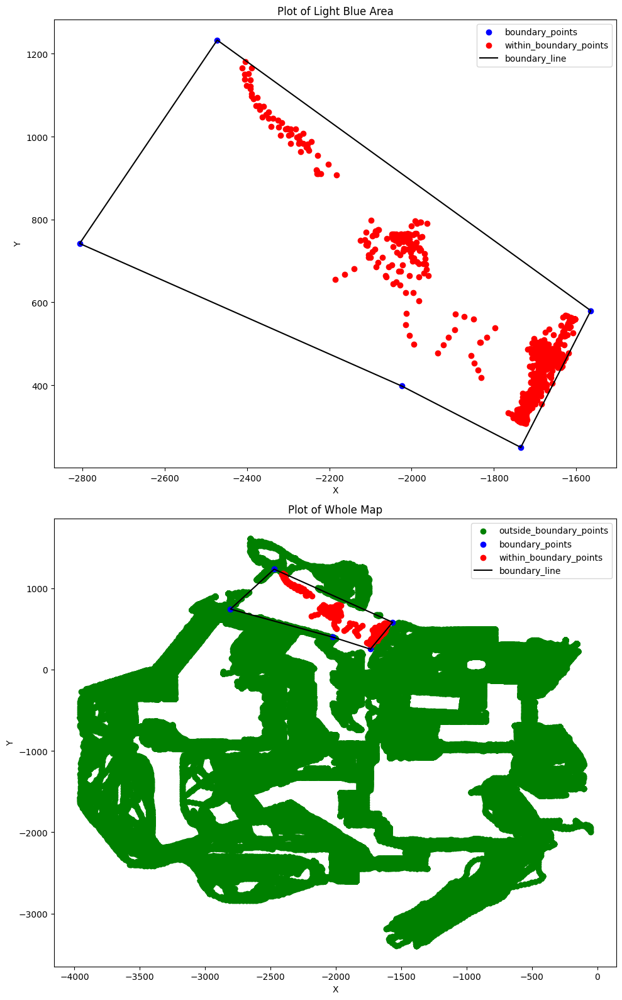

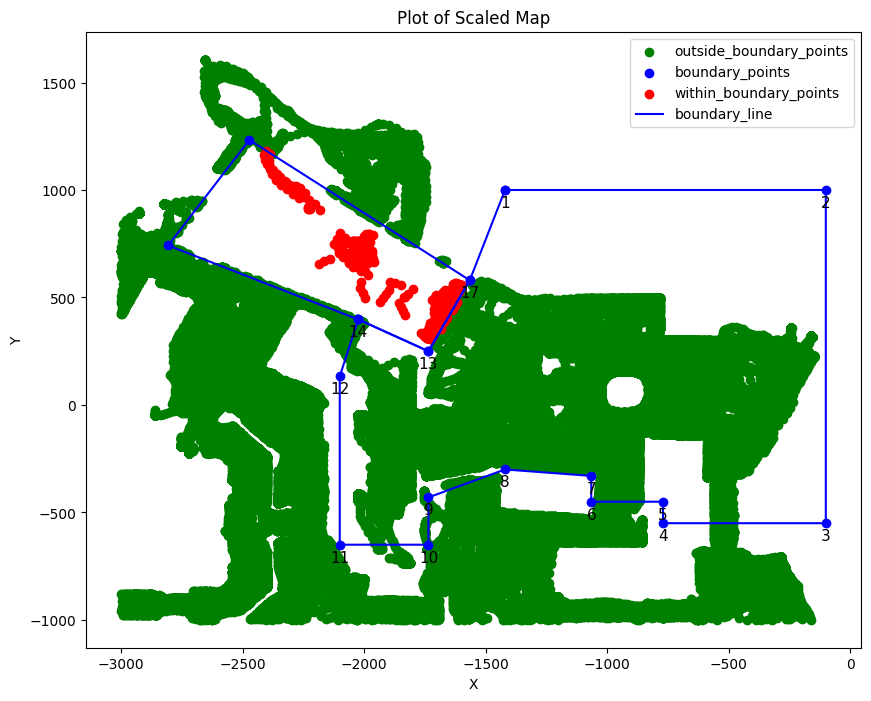



Extracted the weapon classes from the inventory and stored in "weapons" column.




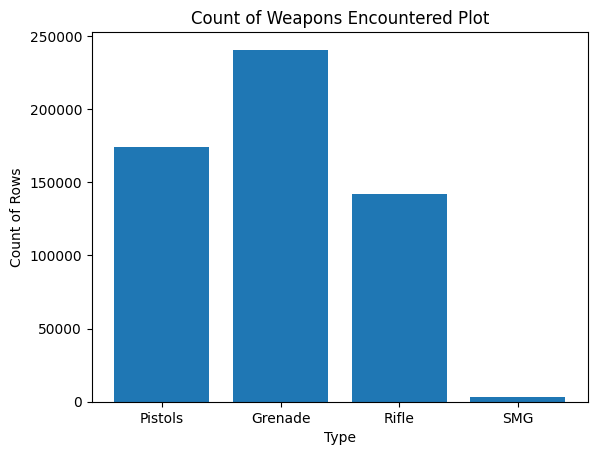

In [3]:
class ProcessedGameState:


  def __init__(self, file_path):
      '''
        initializing file path
      '''
      self.file_path = file_path


  def extract(self):
      '''
        function to extract data from parquet file
      '''

      df = pd.read_parquet(self.file_path, engine='pyarrow')
      return df
  

  def explore(self, data):
      '''
        understanding the- what columns it has, count of null values, does it have duplicate values(same location on same time would mean there's error in the data)
        understanding how many rounds were played
        checking all the area names on the map given
        checking names of players playing the game
        checking names of players in team 2
      '''

      print(data.info())
      print(data.duplicated(['round_num','tick','x','y','z']).sum())
      print(data.describe())
      print(data.head())
      print('\nTotal Number of rounds played:',data['round_num'].unique())
      print('\nArea names on the given map:',data['area_name'].unique())
      print('\nNames of players playing the game:',data['player'].unique())
      team2 = data[data['team']=='Team2']
      print('\nPlayers playing for team2:',team2['player'].unique())
      print('\n\n')

      x_avg_points = data.groupby('area_name')['x'].mean()
      y_avg_points = data.groupby('area_name')['y'].mean()

      fig, ax = plt.subplots(figsize=(10, 8)) 

      ax.scatter(data['x'], data['y'], color='green', label='all_points')
      ax.scatter(x_avg_points.values,y_avg_points.values, color='black', label='area_names')

      ax.set_xlabel('X')
      ax.set_ylabel('Y')
      ax.set_title('Plot of Whole Map with Area Names')
      ax.legend()
      fig.show()

      for key, value in x_avg_points.items():
        ax.text(x_avg_points[key], y_avg_points[key], key, va='bottom', ha='center')


  def rows_within_boundary(self,boundary_points,z,data):
      '''
        given boundary points - vertices of a polygon/boundary
        given constraints on z axis
        given data points
        stores status of a row in 'within_boundary' column where True means the row is in inside the boundary specified and False means it is not inside the specified boundary
      '''

      boundary_path = mpl_path.Path(boundary_points)
      data['coordinates'] = data.apply(lambda row: [row['x'], row['y']], axis=1)
      data['within_boundary'] = data['coordinates'].apply(lambda point: boundary_path.contains_point(point))
      print('\nCount of points within x,y axes boundary of vertices 13,14,15,16,17: ', (data['within_boundary'] == True).sum())
      data['within_boundary'] = np.where((data['z'] >= z[0]) & (data['z'] <= z[1]) & (data['within_boundary']==True), True, False)
      print('\nCount of points within the boundary after considering the Z axis: ',(data['within_boundary'] == True).sum())
      print('\nStatus of whether or not each row falls within the provided boundary is stored in "within_boundary" column.')

      return data


  def visualize_rows_within_boundary(self,x,y,x_filtered,y_filtered,x_outside_boundary,y_outside_boundary,x_outside_boundary_scaled,y_outside_boundary_scaled,data):
      '''
        using all the row's coordinates to make a pseudo map
        plotting the boundary on the map
        plotting the points within the specified boundary on map
      '''

      boundary_points = np.column_stack((x, y))
      boundary_path = mpl_path.Path(boundary_points)

      for index, value in data['within_boundary'].items():
        if value == True:
          x_filtered.append(data['x'][index])
          y_filtered.append(data['y'][index])
        else:
          if not boundary_path.contains_point(data['coordinates'][index]):
            x_outside_boundary.append(data['x'][index])
            y_outside_boundary.append(data['y'][index])
            if data['x'][index]>-3000 and data['y'][index]>-1000:
              x_outside_boundary_scaled.append(data['x'][index])
              y_outside_boundary_scaled.append(data['y'][index])

      fig, ax = plt.subplots(2,1,figsize=(10, 16)) 
      ax[0].scatter(x, y, color='blue', label='boundary_points')
      ax[0].scatter(x_filtered, y_filtered, color='red', label='within_boundary_points')
      ax[0].plot(x+x[:1], y+y[:1], color='black', label='boundary_line')

      ax[0].set_xlabel('X')
      ax[0].set_ylabel('Y')
      ax[0].set_title('Plot of Light Blue Area')
      ax[0].legend()

      print('\n\n')

      ax[1].scatter(x_outside_boundary, y_outside_boundary, color='green', label='outside_boundary_points')
      ax[1].scatter(x, y, color='blue', label='boundary_points')
      ax[1].scatter(x_filtered, y_filtered, color='red', label='within_boundary_points')
      ax[1].plot(x+x[:1], y+y[:1], color='black', label='boundary_line')

      ax[1].set_xlabel('X')
      ax[1].set_ylabel('Y')
      ax[1].set_title('Plot of Whole Map')
      ax[1].legend()

      plt.tight_layout()
      plt.show()

      return x_filtered,y_filtered,x_outside_boundary,y_outside_boundary,x_outside_boundary_scaled,y_outside_boundary_scaled


  def visualize_scaled_version(self,x,y,xnv,ynv,x_bsb,y_bsb,x_filtered,y_filtered,x_outside_boundary_scaled,y_outside_boundary_scaled,data):
      '''
        for the specific portion of map given in the assesment, showing a scaled version of the map with the larger boundary
      '''

      print('\n\n')
      fig, ax = plt.subplots(figsize=(10, 8)) 
      ax.scatter(x_outside_boundary_scaled, y_outside_boundary_scaled, color='green', label='outside_boundary_points')
      ax.scatter(x, y, color='blue', label='boundary_points')
      ax.scatter(x_filtered, y_filtered, color='red', label='within_boundary_points')
      ax.plot(x+x[:1], y+y[:1], color='blue', label='boundary_line')
      ax.scatter(xnv,ynv, color='blue')
      ax.plot(xnv, ynv, color='blue')

      ax.set_xlabel('X')
      ax.set_ylabel('Y')
      ax.set_title('Plot of Scaled Map')
      ax.legend()

      for key, value in x_bsb.items():
        ax.text(x_bsb[key], y_bsb[key]-25, key, va='top', ha='center',fontsize=11)

      plt.show()

      
  def get_weapons_class(self,data):
      '''
        extracting weapon_class from 'inventory' column and storing all the weapons in 'weapon' column
      '''

      weapons = []
      weapons_kind=defaultdict(lambda: 0)
      for value in data['inventory']:
        if value is not None:
          temp = []
          for each_weapon in value:
            if each_weapon!=None and 'weapon_class' in each_weapon:
                temp.append(each_weapon['weapon_class'])
                weapons_kind[each_weapon['weapon_class']]+=1
          weapons.append(temp)
        else:
          weapons.append(None)

      data['weapons']=weapons
      print('\n\nExtracted the weapon classes from the inventory and stored in "weapons" column.')
      print('\n')

      weapons_x = list(weapons_kind.keys())
      weapons_y = list(weapons_kind.values())

      plt.bar(weapons_x, weapons_y)
      plt.xlabel('Type')
      plt.ylabel('Count of Rows')
      plt.title('Count of Weapons Encountered Plot')
      plt.show()

      return data


  def get_team2_T_data(self,data):
      '''
        retrieving smaller subset of the dataset where the rows are of Team 2 playing on T(terrorist) side
      '''

      condition1 = data['is_alive'] == True
      condition2 = data['team'] == 'Team2'
      condition3 = data['side'] == 'T'

      T_result = data[condition1 & condition2 & condition3]

      return T_result

  def count_boundary_crossings(self,data,t_data,boundary_points_BombsiteB,x,y,xnv,ynv):
      '''
        for every round team 2 plays as T
        for every player of team 2
        checked if currently the player is in light blue area then on the next tick are they entering the dark blue boundary
        checked if they enter the bigger dark blue boundary coordinates via any other area
        returned both the counts
      '''

      count_light_blue = 0
      count_other_areas = 0

      boundary_path_dark_blue = mpl_path.Path(boundary_points_BombsiteB)

      for round in t_data['round_num'].unique():
        round_wise = t_data[t_data['round_num'] == round]
        
        for player in round_wise['player'].unique():
          player_wise = round_wise[round_wise['player']==player]

          sorted_time = player_wise.sort_values('tick')

          sorted_time['next_coordinate'] = sorted_time['coordinates'].shift(-1)
          sorted_time = sorted_time[:-1]
          sorted_time['next_tick'] = sorted_time['next_coordinate'].apply(lambda point: boundary_path_dark_blue.contains_point(point))
          
          self.plot_player_path(data,sorted_time,x,y,xnv,ynv,player,round)
          

          for index, row in sorted_time.iterrows():

            if row['within_boundary']==True and row['next_tick']==True:
              count_light_blue += 1
            
            elif boundary_path_dark_blue.contains_point(row['coordinates'])!=True and row['next_tick']==True:
              count_other_areas += 1

      return count_light_blue, count_other_areas


  def plot_player_path(self,data,sorted_time,x,y,xnv,ynv,player,round):
      '''
        plotting the trajectory of a player in a round of the game
      '''

      sorted_time['map_val'] = sorted_time['clock_time'].apply(lambda x: int(x.split(':')[0]) * 60 + int(x.split(':')[1]))

      fig, ax = plt.subplots(figsize=(10, 8)) 

      ax.scatter(data['x'], data['y'], color='black', label='all_points')
      cmap = matplotlib.colormaps['cool']
      scatter=ax.scatter(sorted_time['x'], sorted_time['y'], c=sorted_time['map_val'], cmap=cmap)
      ax.plot(x+x[:1], y+y[:1], color='blue', label='boundary_line')
      ax.plot(xnv, ynv, color='blue')

      cbar = plt.colorbar(scatter)
      cbar.set_label('Clock Timer in Seconds')
      ax.set_xlabel('X')
      ax.set_ylabel('Y')
      map_title = 'Path of '+player+' in round '+str(round) +' on Map'
      ax.set_title(map_title)
      ax.legend()
      fig.show()


  def calculate_avg_clock_time(self,t_data):
      '''
        calculating the average clock timer for all the rounds team2 plays as T
        calculating the overall average of all rounds combined
      '''

      counters = []

      for round in t_data['round_num'].unique():
          round_wise = t_data[t_data['round_num'] == round]
          round_counter = self.calculate_round_avg_clock_time(round_wise)
          if round_counter!=0:
            counters.append(round_counter)

      overall_avg_clock_time = (sum(counters) / len(counters)) / 60

      return counters, overall_avg_clock_time


  def calculate_round_avg_clock_time(self,round_data):
      '''
        for a particular round
        for every player, sorted their data according to tick
        stored their next encountered location in 'next_area' column
        check if the next area they enter is 'BombsiteB' stored the value in terms of True or False in 'target_location'
        keeping track of every player entering and exiting BombsiteB and updating the ammo of that team in BombsiteB
        returning the average clock timer for this particular round
      '''

      combined_data = pd.DataFrame()

      for player in round_data['player'].unique():
          player_wise = round_data[round_data['player'] == player]
          sorted_time = player_wise.sort_values('tick')
          sorted_time['next_area'] = sorted_time['area_name'].shift(-1)
          sorted_time = sorted_time[:-1]
          sorted_time['target_location'] = sorted_time['next_area'] == 'BombsiteB'
          combined_data = pd.concat([combined_data, sorted_time])

      round_counter = 0
      people_counter = 0
      weapon_count = {'Rifle': 0, 'SMG': 0}

      for index, row in combined_data.iterrows():
          if row['area_name'] != 'BombsiteB' and row['target_location'] == True:
              if 'SMG' in row['weapons']:
                  weapon_count['SMG'] += 1
              if 'Rifle' in row['weapons']:
                  weapon_count['Rifle'] += 1
              if weapon_count['Rifle'] >= 2 or weapon_count['SMG'] >= 2:
                  people_counter += 1
                  round_counter += int(row['clock_time'].split(':')[0]) * 60 + int(row['clock_time'].split(':')[1])

          elif row['area_name'] == 'BombsiteB' and row['target_location'] != True:
              if 'SMG' in row['weapons'] and weapon_count['SMG'] > 0:
                  weapon_count['SMG'] -= 1
              if 'Rifle' in row['weapons'] and weapon_count['Rifle'] > 0:
                  weapon_count['Rifle'] -= 1

      if people_counter != 0:
          round_avg_clock_time = round_counter / people_counter
          return round_avg_clock_time
      else:
          return 0


  def get_team2_CT_BombsiteB_data(self,data):
    '''
        retrieving smaller subset of the dataset where the rows are of Team 2 playing on CT(terrorist) side in 'BombsiteB' area
    '''

    condition1 = data['is_alive'] == True
    condition2 = data['team'] == 'Team2'
    condition3 = data['side'] == 'CT'
    condition4 = data['area_name'] == 'BombsiteB'

    CT_result = data[condition1 & condition2 & condition3 & condition4]

    return CT_result

  
  def generate_heatmap(self,ct_data):
    '''
      heatmap to see frequency of players on various bins of coordinates
    '''

    fig, ax = plt.subplots(figsize=(10, 8))
    heatmap, xedges, yedges = np.histogram2d(ct_data['x'], ct_data['y'], bins=20)

    plt.imshow(heatmap.T, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], cmap='hot')
    plt.colorbar(label='Count')
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.title('Heatmap from Coordinates')
    plt.show()


  def generate_overlayed_scatter_plot(self,data,ct_data):
      '''
        scatter plot of the required players on the map overlapping all other player positions
      '''

      fig, ax = plt.subplots(figsize=(10, 8))
      ax.scatter(data['x'], data['y'], color='black', label='all_points')
      ax.scatter(ct_data['x'], ct_data['y'], color='red', label='Team2 CT in BombsiteB')
      ax.set_xlabel('X')
      ax.set_ylabel('Y')
      ax.set_title('Plot of Team2 CT players in BombsiteB overlapping all player points on the Whole Map')
      ax.legend()
      plt.show()


  def generate_overlayed_hexbin_plot(self,data,ct_data):
      '''
        function to overlap a heatmap structure on the map to better understand the position of players on the map
      '''

      fig, ax = plt.subplots(figsize=(10, 8))
      ax.scatter(data['x'], data['y'], color='black', label='all_points')
      plt.hexbin(ct_data['x'], ct_data['y'], gridsize=7, cmap='cool', alpha=0.8)
      plt.colorbar(label='Frequency Team2 CT in BombsiteB')
      ax.set_xlabel('X')
      ax.set_ylabel('Y')
      ax.set_title('Plot of Frequency Team2 CT players in BombsiteB overlapping all player points on the Whole Map')
      ax.legend()
      plt.show()


  def load(self,data):
      '''
        loading the transformed data into a new paraquet file
      '''
      data.to_parquet('transformed_game_state_frame_data.parquet')


# coordinates of the light blue boundary are given

x = [-1735, -2024, -2806, -2472, -1565]
y = [250, 398, 742, 1233, 580]
z = [285,421]

x_filtered = []
y_filtered = []
x_outside_boundary = []
y_outside_boundary = []
x_outside_boundary_scaled = []
y_outside_boundary_scaled = []


# estimated the coordinates of dark blue boundary using cv and scaling them

x_bsb={
    '1':-1420,
    '2':-100,
    '3':-100,
    '4':-770,
    '5':-770,
    '6':-1065,
    '7':-1065,
    '8':-1420,
    '9':-1735,
    '10':-1735,
    '11':-2100,
    '12':-2100,
    '14':-2024,
    '13':-1735,
    '17':-1565,
}

y_bsb={
    '1':1000,
    '2':1000,
    '3':-550,
    '4':-550,
    '5':-450,
    '6':-450,
    '7':-330,
    '8':-300,
    '9':-430,
    '10':-650,
    '11':-650,
    '12':133,
    '14':398,
    '13':250,
    '17':580,
}


boundary_points = np.array([x, y])
boundary_points = boundary_points.transpose()

xnv = [value for value in x_bsb.values()]
ynv =  [value for value in y_bsb.values()]

boundary_points_BombsiteB = np.array([xnv,ynv])
boundary_points_BombsiteB = boundary_points_BombsiteB.transpose()

xnv.append(xnv[0])
ynv.append(ynv[0])

parquet_file = '/content/game_state_frame_data.parquet' 

game_data = ProcessedGameState(parquet_file) #q1.a

data = game_data.extract() #q1.a

game_data.explore(data) #q1.a

data = game_data.rows_within_boundary(boundary_points,z,data) #q1.b

x_filtered,y_filtered,x_outside_boundary,y_outside_boundary,x_outside_boundary_scaled,y_outside_boundary_scaled = game_data.visualize_rows_within_boundary(x,y,x_filtered,y_filtered,x_outside_boundary,y_outside_boundary,x_outside_boundary_scaled,y_outside_boundary_scaled,data) #q1.b

game_data.visualize_scaled_version(x,y,xnv,ynv,x_bsb,y_bsb,x_filtered,y_filtered,x_outside_boundary_scaled,y_outside_boundary_scaled,data) #q1.b

data=game_data.get_weapons_class(data) #q1.c

game_data.load(data) #q1.a


Number of Team 2 T side inside the light blue boundary: 19


<ipython-input-3-d68f3bff1d8d>:243: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10, 8))


Number of times a player from team2 T side enters the dark blue boundary via light blue boundary area 0
Number of times a player from team2 T side enters the dark blue boundary via any other area except the light blue boundary area:  36


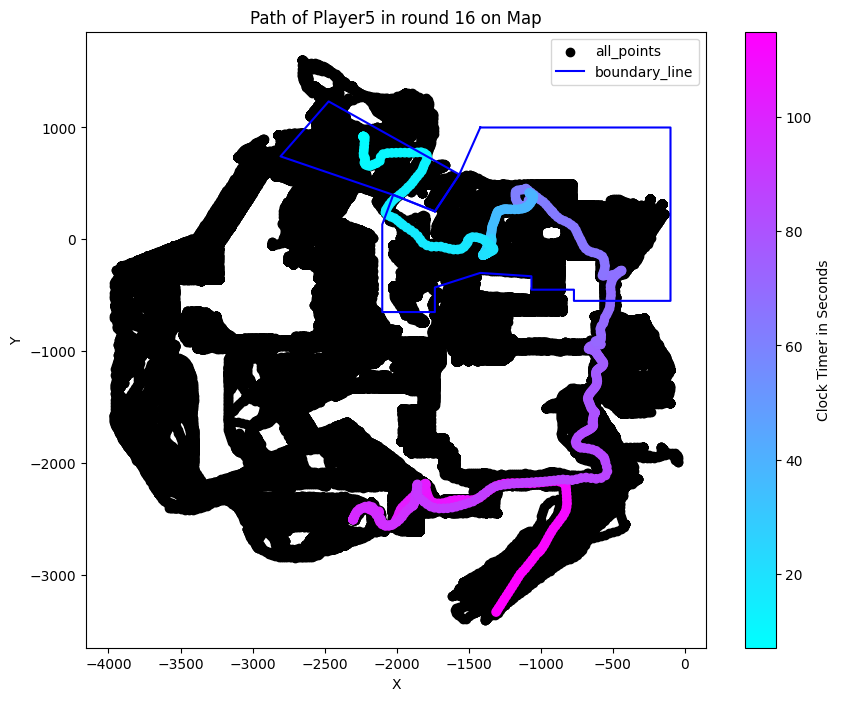

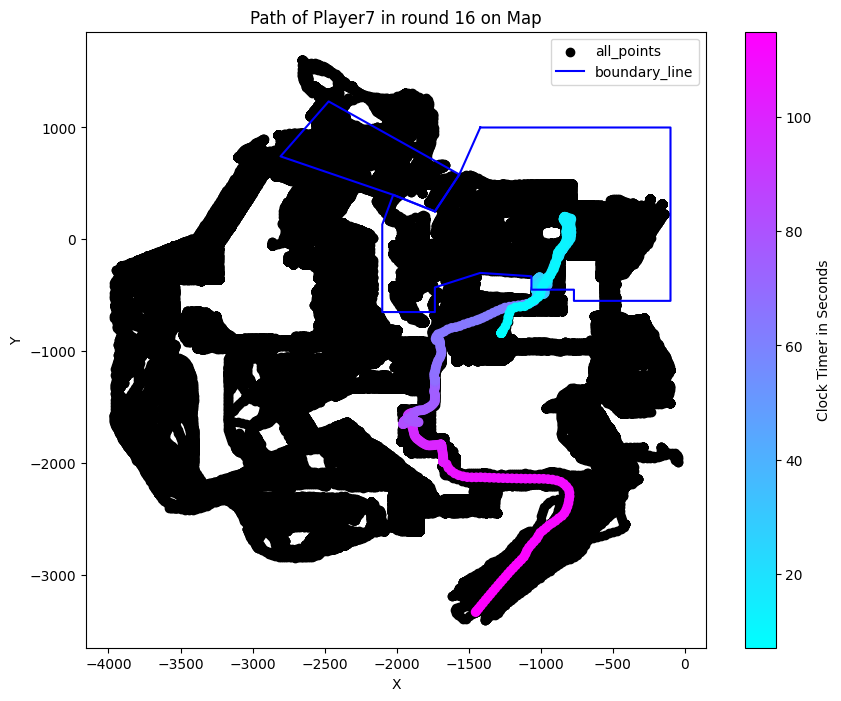

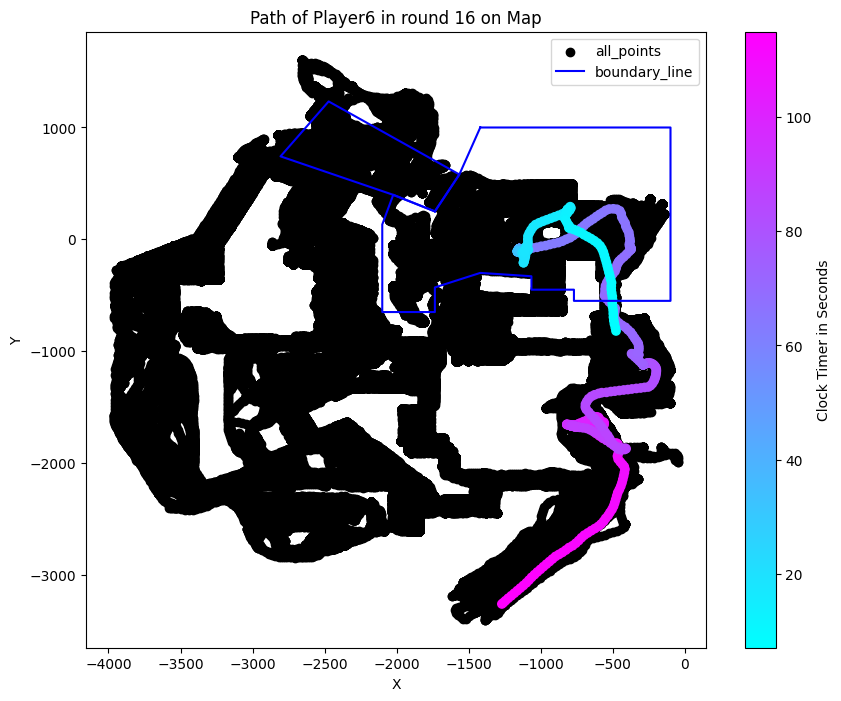

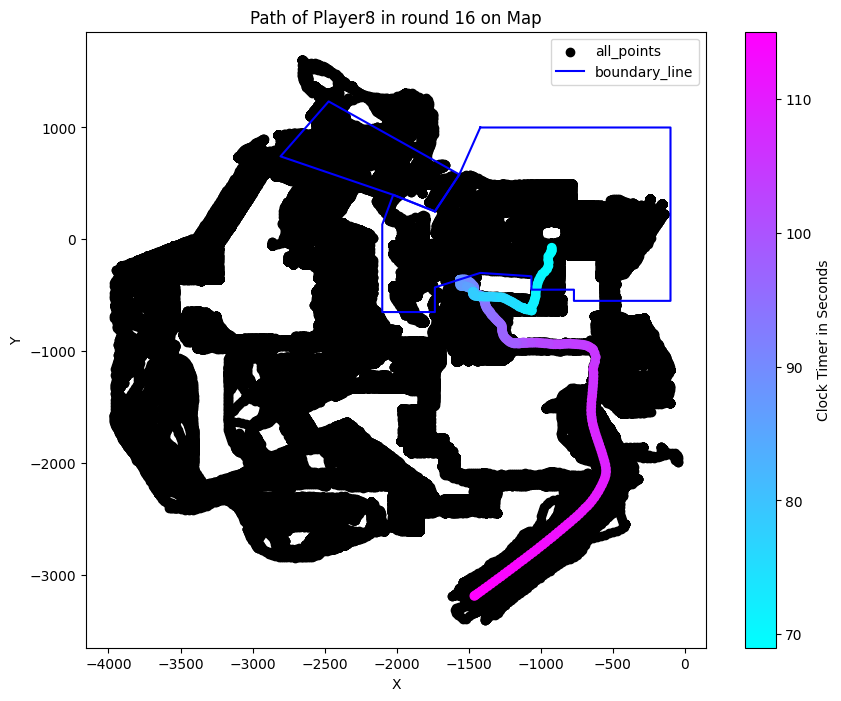

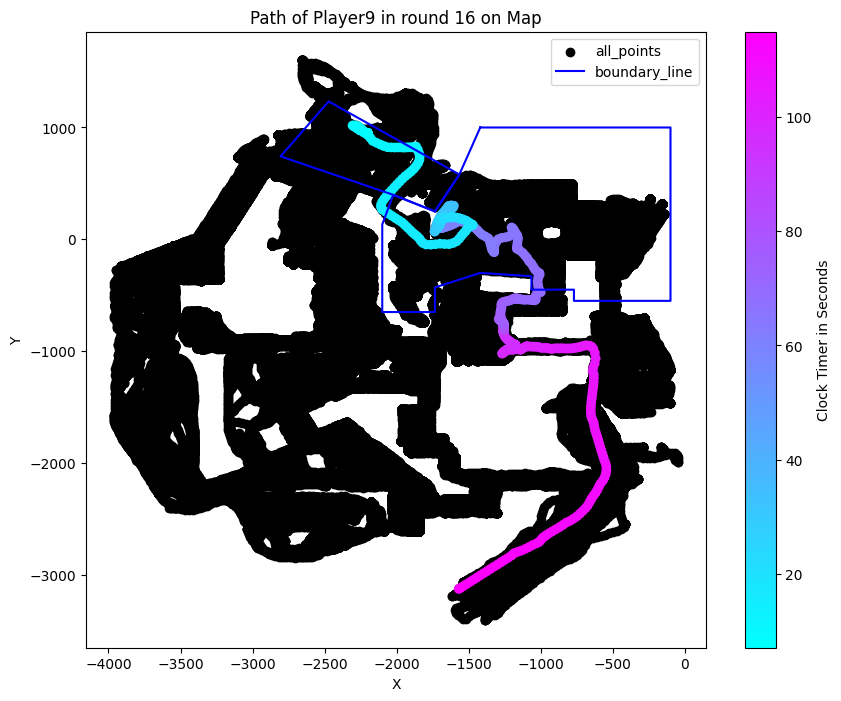

...

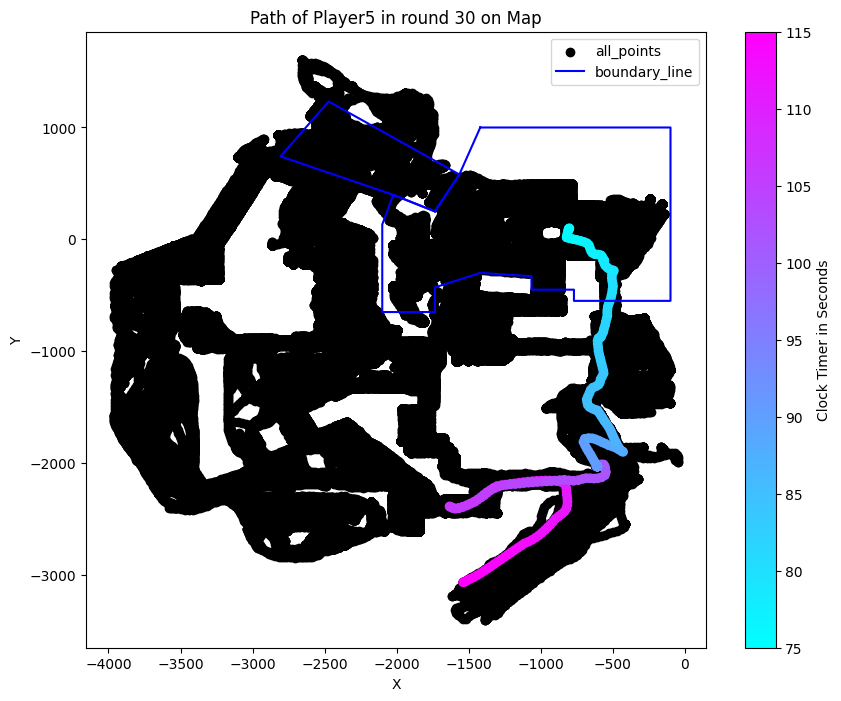

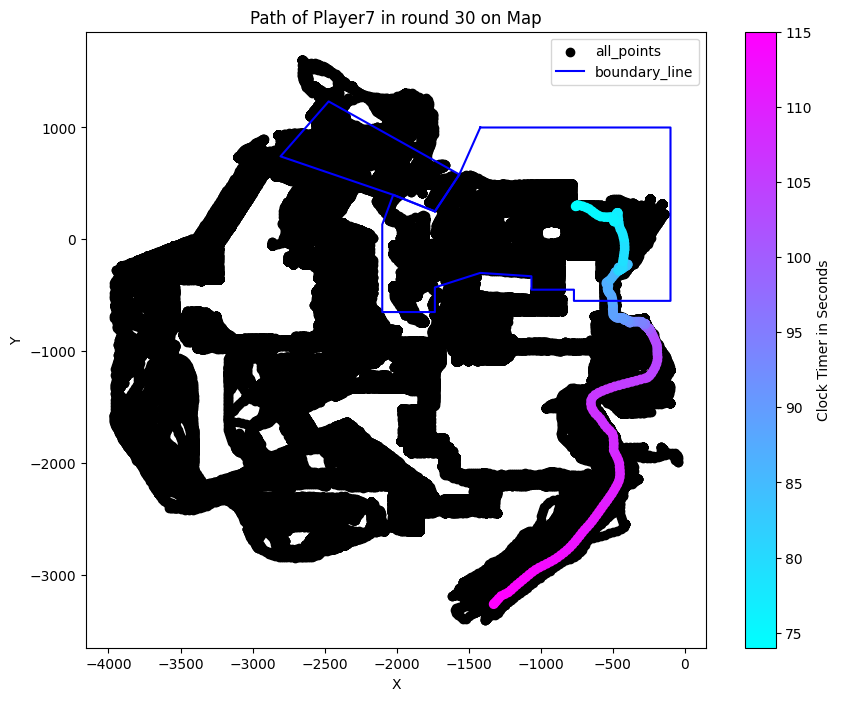

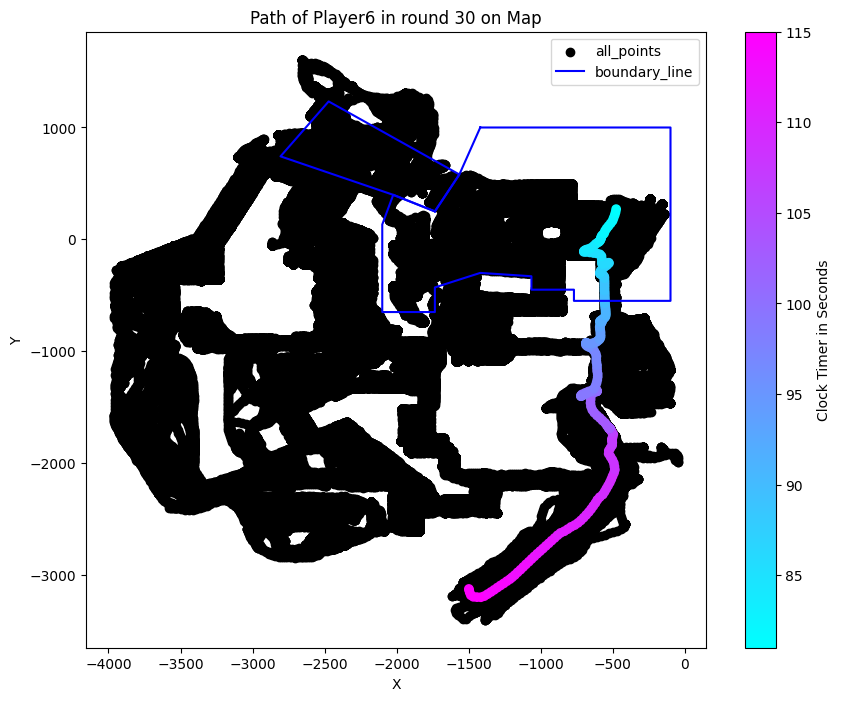

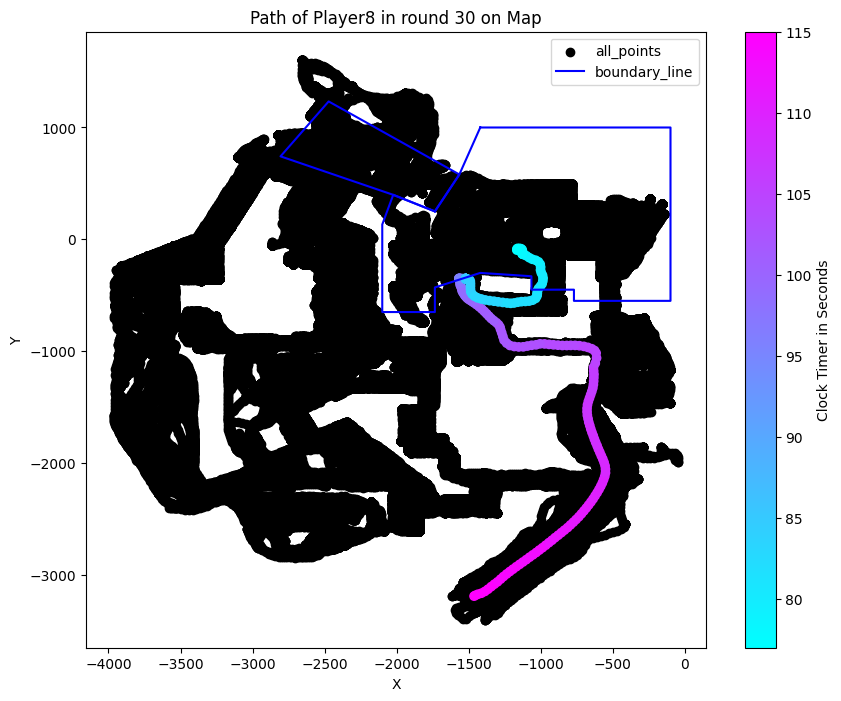

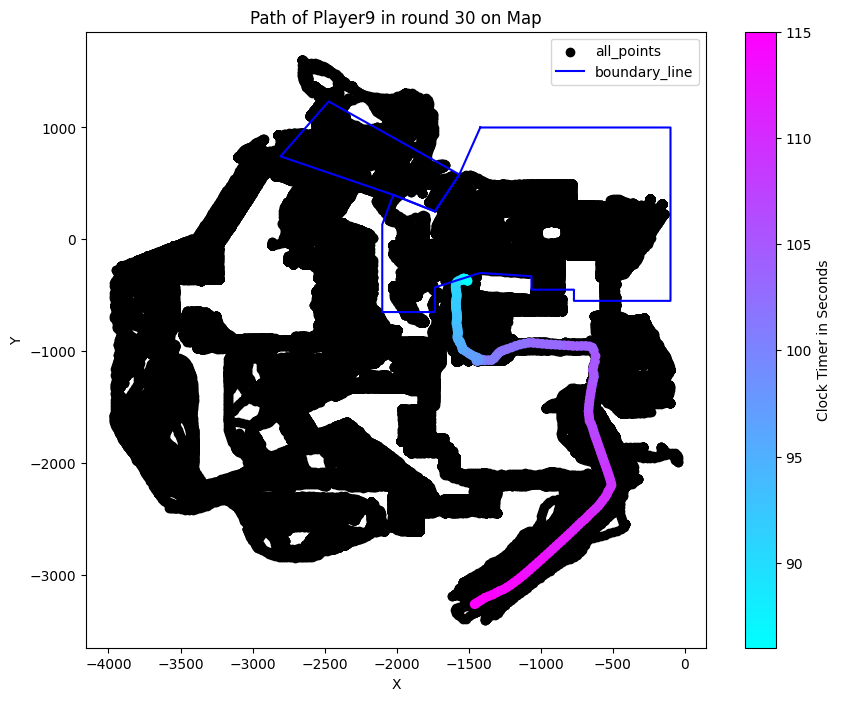

In [4]:
#q2.a 

t_data = game_data.get_team2_T_data(data)

print('Number of Team 2 T side inside the light blue boundary:',len(t_data[t_data['within_boundary']==True]))

count_light_blue, count_other_areas = game_data.count_boundary_crossings(data,t_data,boundary_points_BombsiteB,x,y,xnv,ynv)

print('Number of times a player from team2 T side enters the dark blue boundary via light blue boundary area',count_light_blue)
print('Number of times a player from team2 T side enters the dark blue boundary via any other area except the light blue boundary area: ',count_other_areas)


In [5]:
#q2.b

counters, overall_avg_clock_time = game_data.calculate_avg_clock_time(t_data)

print('Average clock timer in seconds across different rounds:', counters)
print('Overall average timer in minutes that Team2 on T (terrorist) side enters “BombsiteB” with least 2 rifles or SMGs:',overall_avg_clock_time)

Average clock timer in seconds across different rounds: [97.0, 72.0, 77.5]
Overall average timer in minutes that Team2 on T (terrorist) side enters “BombsiteB” with least 2 rifles or SMGs: 1.3694444444444445


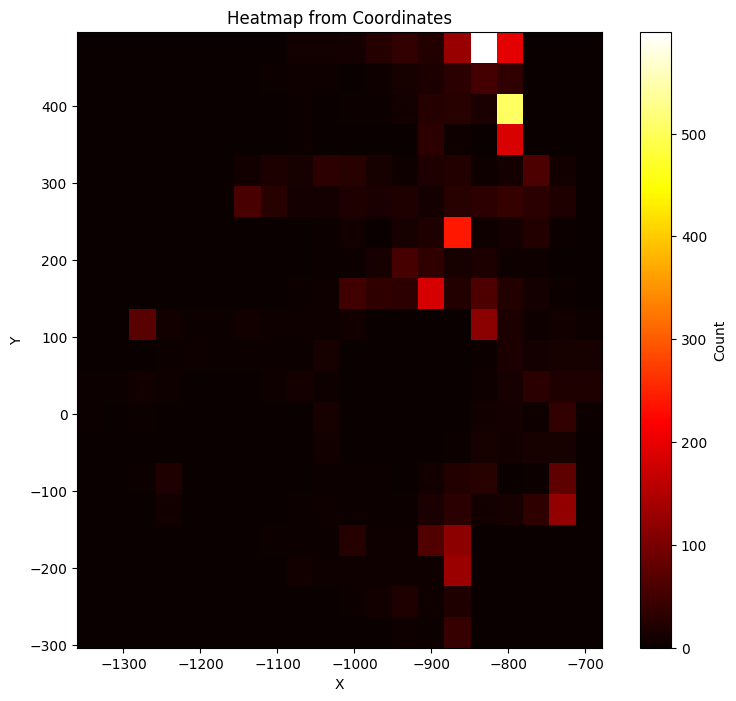

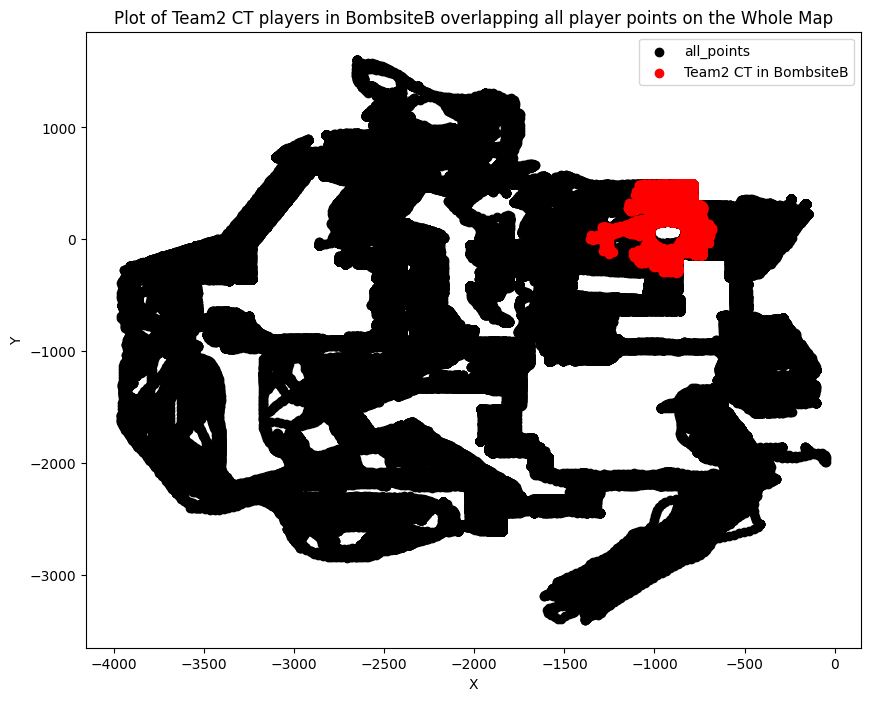

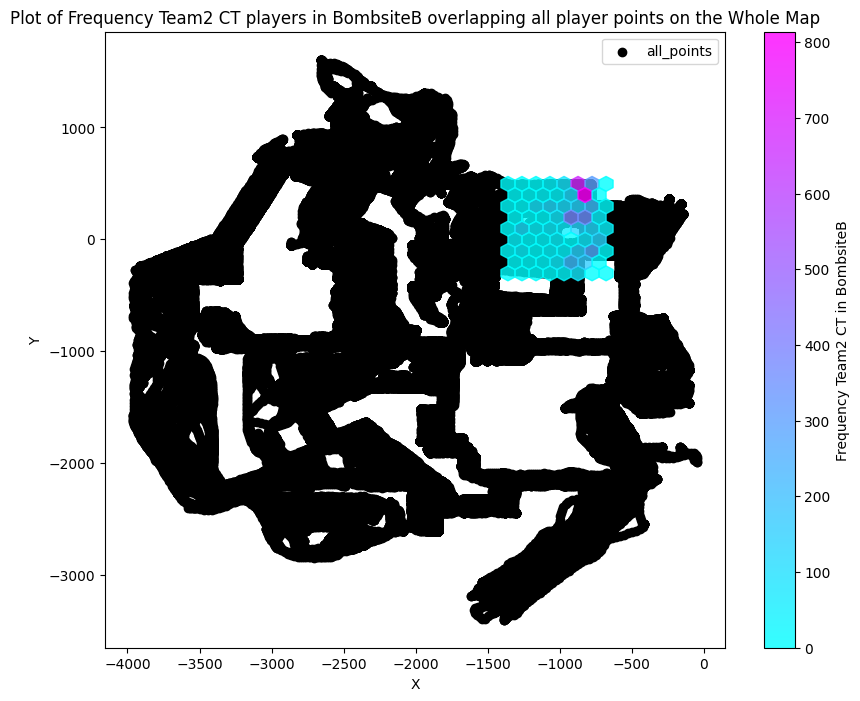

In [6]:
#q2.c

ct_data = game_data.get_team2_CT_BombsiteB_data(data)
game_data.generate_heatmap(ct_data)
game_data.generate_overlayed_scatter_plot(data,ct_data)
game_data.generate_overlayed_hexbin_plot(data,ct_data)

<h1>Block Wise Implementation</h1>

In [7]:
parquet_file = '/content/game_state_frame_data.parquet' 
df = pd.read_parquet(parquet_file, engine='pyarrow')

In [8]:
df

,round_num,tick,side,team,hp,armor,is_alive,x,y,z,...,equipment_value_freezetime_end,area_name,seconds,clock_time,t_alive,ct_alive,bomb_planted,map_name,utility_used,player
0,1,2511,T,Team1,100,100,True,-1310,-3333,294,...,900,TSpawn,0,01:55,5,5,False,de_overpass,0.0,Player0
1,1,2527,T,Team1,100,100,True,-1303,-3322,294,...,900,TSpawn,0,01:55,5,5,False,de_overpass,0.0,Player0
2,1,2543,T,Team1,100,100,True,-1290,-3303,292,...,900,TSpawn,0,01:55,5,5,False,de_overpass,0.0,Player0
3,1,2559,T,Team1,100,100,True,-1275,-3280,290,...,900,TSpawn,0,01:55,5,5,False,de_overpass,0.0,Player0
4,1,2575,T,Team1,100,100,True,-1254,-3262,288,...,900,TSpawn,1,01:55,5,5,False,de_overpass,0.0,Player0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
221325,30,514156,T,Team2,0,0,False,-1508,-372,200,...,4250,Water,41,01:14,1,4,False,de_overpass,0.0,Player9
221326,30,514172,T,Team2,0,0,False,-1508,-372,200,...,4250,Water,41,01:14,1,4,False,de_overpass,0.0,Player9
221327,30,514188,T,Team2,0,0,False,-1508,-372,200,...,4250,Water,42,01:14,1,4,False,de_overpass,0.0,Player9
221328,30,514204,T,Team2,0,0,False,-1508,-372,200,...,4250,Water,42,01:14,1,4,False,de_overpass,0.0,Player9


In [9]:
df.duplicated(['round_num','tick','x','y','z']).sum()

0

In [10]:
df['round_num'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30])

In [11]:
df['area_name'].unique()

array(['TSpawn', 'TStairs', 'Tunnels', 'Fountain', 'LowerPark',
       'Playground', 'Alley', 'Connector', 'BombsiteA', 'Canal', 'Pipe',
       'Water', 'Construction', 'UpperPark', 'Restroom', 'Lobby',
       'StorageRoom', 'SnipersNest', 'BackofA', 'Stairs', 'UnderA',
       'Walkway', 'Bridge', 'BombsiteB', None, 'SideAlley'], dtype=object)

In [12]:
df['player'].unique()

res = df[df['team']=='Team2']
res['player'].unique()

array(['Player5', 'Player7', 'Player6', 'Player8', 'Player9'],
      dtype=object)

In [13]:
boundary_points = np.array([  
  [-1735, 250],
  [-2024, 398],
  [-2806, 742],
  [-2472, 1233],
  [-1565, 580]   ])

boundary_path = mpl_path.Path(boundary_points)

df['coordinates'] = df.apply(lambda row: [row['x'], row['y']], axis=1)

df['within_boundary'] = df['coordinates'].apply(lambda point: boundary_path.contains_point(point))

print('Points within x,y bboundary of 13,14,15,16,17: ', (df['within_boundary'] == True).sum())

df['within_boundary'] = np.where((df['z'] >= 285) & (df['z'] <= 421) & (df['within_boundary']==True), True, False)

print('Points after considering the Z axis: ', (df['within_boundary'] == True).sum())

Points within x,y bboundary of 13,14,15,16,17:  17093
Points after considering the Z axis:  832


<ipython-input-14-5de74cab685a>:15: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for index, value in df['within_boundary'].iteritems():


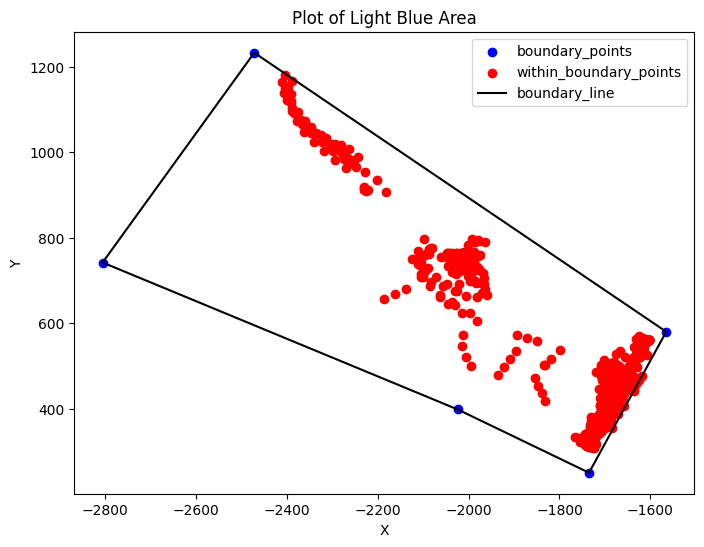

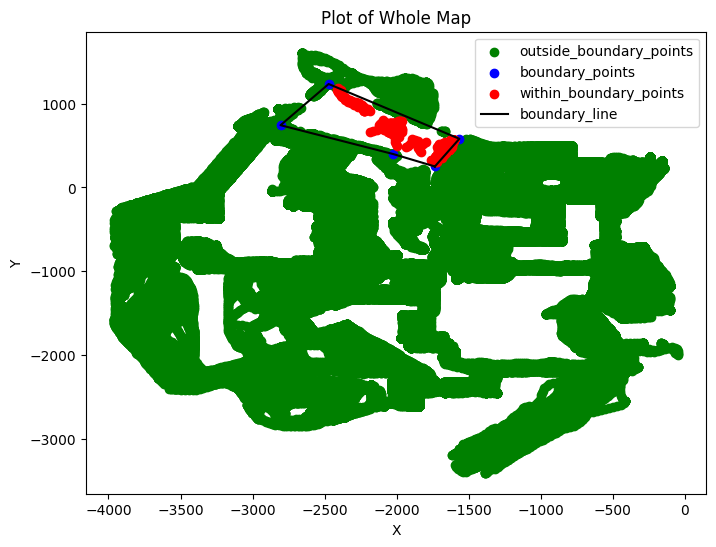

In [14]:
x = [-1735, -2024, -2806, -2472, -1565]
y = [250, 398, 742, 1233, 580]

boundary_points = np.column_stack((x, y))
boundary_path = mpl_path.Path(boundary_points)

x_filtered = []
y_filtered = []
x_outside_boundary = []
y_outside_boundary = []
x_outside_boundary_scaled = []
y_outside_boundary_scaled = []


for index, value in df['within_boundary'].iteritems():
  if value == True:
    x_filtered.append(df['x'][index])
    y_filtered.append(df['y'][index])
  else:
    if not boundary_path.contains_point(df['coordinates'][index]):
      x_outside_boundary.append(df['x'][index])
      y_outside_boundary.append(df['y'][index])
      if df['x'][index]>-3000 and df['y'][index]>-1000:
        x_outside_boundary_scaled.append(df['x'][index])
        y_outside_boundary_scaled.append(df['y'][index])

fig1, ax1 = plt.subplots(figsize=(8, 6)) 

ax1.scatter(x, y, color='blue', label='boundary_points')
ax1.scatter(x_filtered, y_filtered, color='red', label='within_boundary_points')
ax1.plot(x+x[:1], y+y[:1], color='black', label='boundary_line')

ax1.set_xlabel('X')
ax1.set_ylabel('Y')
ax1.set_title('Plot of Light Blue Area')
ax1.legend()

fig1.show()

fig2, ax2 = plt.subplots(figsize=(8, 6)) 

ax2.scatter(x_outside_boundary, y_outside_boundary, color='green', label='outside_boundary_points')
ax2.scatter(x, y, color='blue', label='boundary_points')
ax2.scatter(x_filtered, y_filtered, color='red', label='within_boundary_points')
ax2.plot(x+x[:1], y+y[:1], color='black', label='boundary_line')

ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Plot of Whole Map')
ax2.legend()
fig2.show()

In [15]:
#13: [-1735, 250]

#378 + x = -1735 => x = -1735 -378 = -2113
#-378 + y = 250 => y = 250+378 = 628

x_boundary={
   '13':378,
   '1':500,
   '2':1160,
   '3':1160,
   '4':800,
   '5':800,
   '6':680,
   '7':680,
   '8':519,
   '9':370,
   '10':370,
   '11':238,
   '12':238,
   '14':317,
   '15':71,
   '16':174,
   '17':447
}

y_boundary={
   '13':-378,
   '1':-135,
   '2':-135,
   '3':-740,
   '4':-740,
   '5':-707,
   '6':-707,
   '7':-645,
   '8':-631,
   '9':-673,
   '10':-793,
   '11':-793,
   '12':-495,
   '14':-346,
   '15':-197,
   '16':-54,
   '17':-252
}

x_boundary = {key: value -2113 for key, value in x_boundary.items()}
y_boundary = {key: value +628 for key, value in y_boundary.items()}

print(x_boundary)
print(y_boundary)

{'13': -1735, '1': -1613, '2': -953, '3': -953, '4': -1313, '5': -1313, '6': -1433, '7': -1433, '8': -1594, '9': -1743, '10': -1743, '11': -1875, '12': -1875, '14': -1796, '15': -2042, '16': -1939, '17': -1666}
{'13': 250, '1': 493, '2': 493, '3': -112, '4': -112, '5': -79, '6': -79, '7': -17, '8': -3, '9': -45, '10': -165, '11': -165, '12': 133, '14': 282, '15': 431, '16': 574, '17': 376}


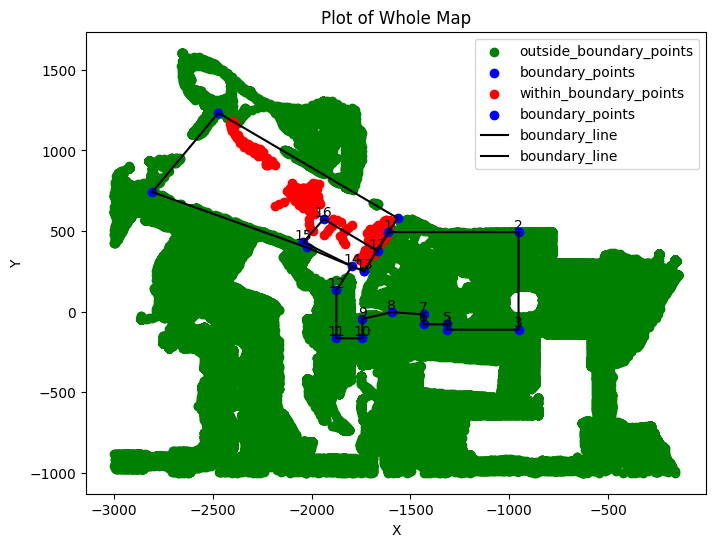

In [16]:
fig2, ax2 = plt.subplots(figsize=(8, 6)) 

xv = x_boundary.values()
yv = y_boundary.values()

ax2.scatter(x_outside_boundary_scaled, y_outside_boundary_scaled, color='green', label='outside_boundary_points')
ax2.scatter(x, y, color='blue', label='boundary_points')
ax2.scatter(x_filtered, y_filtered, color='red', label='within_boundary_points')
ax2.scatter(xv, yv, color='blue', label='boundary_points')
ax2.plot(x+x[:1], y+y[:1], color='black', label='boundary_line')
ax2.plot(xv, yv, color='black', label='boundary_line')

ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Plot of Whole Map')
ax2.legend()
fig2.show()

for key, value in x_boundary.items():
  ax2.text(x_boundary[key], y_boundary[key], key, va='bottom', ha='center')

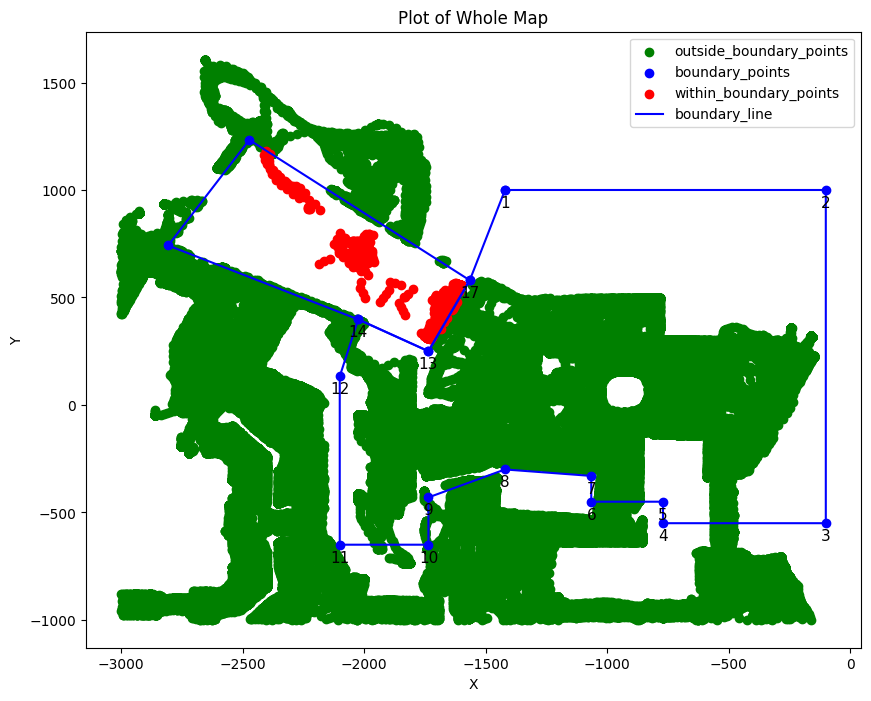

In [17]:
x_new={
    '1':-1420,
    '2':-100,
    '3':-100,
    '4':-770,
    '5':-770,
    '6':-1065,
    '7':-1065,
    '8':-1420,
    '9':-1735,
    '10':-1735,
    '11':-2100,
    '12':-2100,
    '14':-2024,
    '13':-1735,
    '17':-1565,
}

y_new={
    '1':1000,
    '2':1000,
    '3':-550,
    '4':-550,
    '5':-450,
    '6':-450,
    '7':-330,
    '8':-300,
    '9':-430,
    '10':-650,
    '11':-650,
    '12':133,
    '14':398,
    '13':250,
    '17':580,
}

xnv = [value for value in x_new.values()]
ynv =  [value for value in y_new.values()]

xnv.append(-1420)
ynv.append(1000)

fig2, ax2 = plt.subplots(figsize=(10, 8)) 

ax2.scatter(x_outside_boundary_scaled, y_outside_boundary_scaled, color='green', label='outside_boundary_points')
ax2.scatter(x, y, color='blue', label='boundary_points')
ax2.scatter(x_filtered, y_filtered, color='red', label='within_boundary_points')
ax2.scatter(xnv,ynv, color='blue')
ax2.plot(x+x[:1], y+y[:1], color='blue', label='boundary_line')
ax2.plot(xnv, ynv, color='blue')

ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Plot of Whole Map')
ax2.legend()
fig2.show()

for key, value in x_new.items():
  ax2.text(x_new[key], y_new[key]-25, key, va='top', ha='center',fontsize=11)

In [18]:
weapons = []
weapons_kind=defaultdict(lambda: 0)
for value in df['inventory']:
  #print(value)
  if value is not None:
    temp = []
    for each_weapon in value:
      if each_weapon!=None and 'weapon_class' in each_weapon:
          temp.append(each_weapon['weapon_class'])
          #print(each_weapon['weapon_class'])
          weapons_kind[each_weapon['weapon_class']]+=1
    weapons.append(temp)
  else:
    weapons.append(None)

df['weapons']=weapons


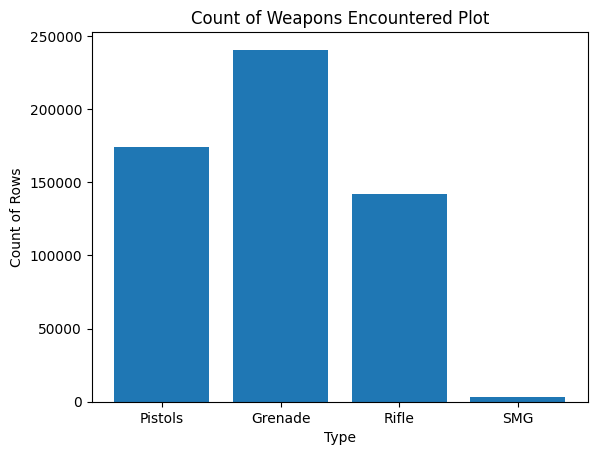

In [19]:
weapons_x = list(weapons_kind.keys())
weapons_y = list(weapons_kind.values())

plt.bar(weapons_x, weapons_y)
plt.xlabel('Type')
plt.ylabel('Count of Rows')
plt.title('Count of Weapons Encountered Plot')
plt.show()

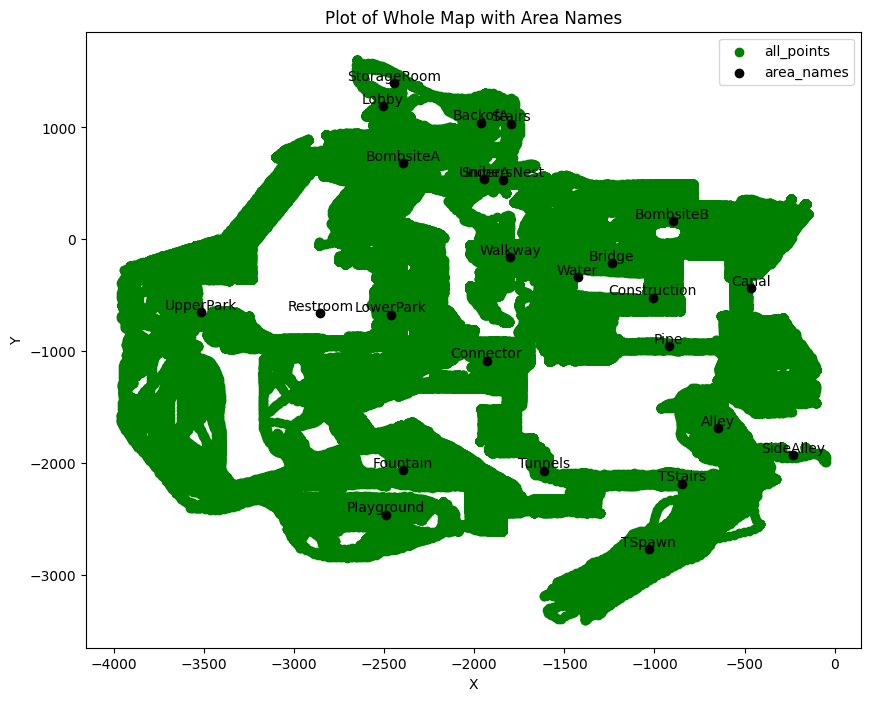

In [20]:
x_avg_points = df.groupby('area_name')['x'].mean()
y_avg_points = df.groupby('area_name')['y'].mean()

fig2, ax2 = plt.subplots(figsize=(10, 8)) 

ax2.scatter(df['x'], df['y'], color='green', label='all_points')
ax2.scatter(x_avg_points.values,y_avg_points.values, color='black', label='area_names')

ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Plot of Whole Map with Area Names')
ax2.legend()
fig2.show()

for key, value in x_avg_points.items():
  ax2.text(x_avg_points[key], y_avg_points[key], key, va='bottom', ha='center')

<h2> Question 2: a </h2>

<h4>
Is entering via the light blue boundary a common strategy used by
Team2 on T (terrorist) side?
</h4>

**Approach:**
<h4>

*   Figure out T from Team2 who are alive and their location(coordiantes) currently inside the light blue boundary.
*   For every round keep track of players moving from light blue boundary to the bigger dark blue boundary towards the BombsiteB.
*   Also keep track of players entering the bigger dark blue boundary towards the BombsiteB from other parts than the light blue boundary so that we can compare the results.
*   Compare the count of the usage of light blue boundary and other areas.

No, even though there are a decent number of points inside the light blue boundary but the players do not really use the light blue boundary to enter the bigger dark blue boundary towards the BombsiteB. Neither do they use it commonly to go towards BombsiteA as can been seen by their trajectory ploted on map.
</h4>

<ipython-input-21-2c176ee48710>:61: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig2, ax2 = plt.subplots(figsize=(10, 8))


Number of Team 2 T side inside the light blue boundary: 19
Number of times a player from team2 T side enters the dark blue boundary via light blue boundary area 0
Number of times a player from team2 T side enters the dark blue boundary via any other area except the light blue boundary area:  36


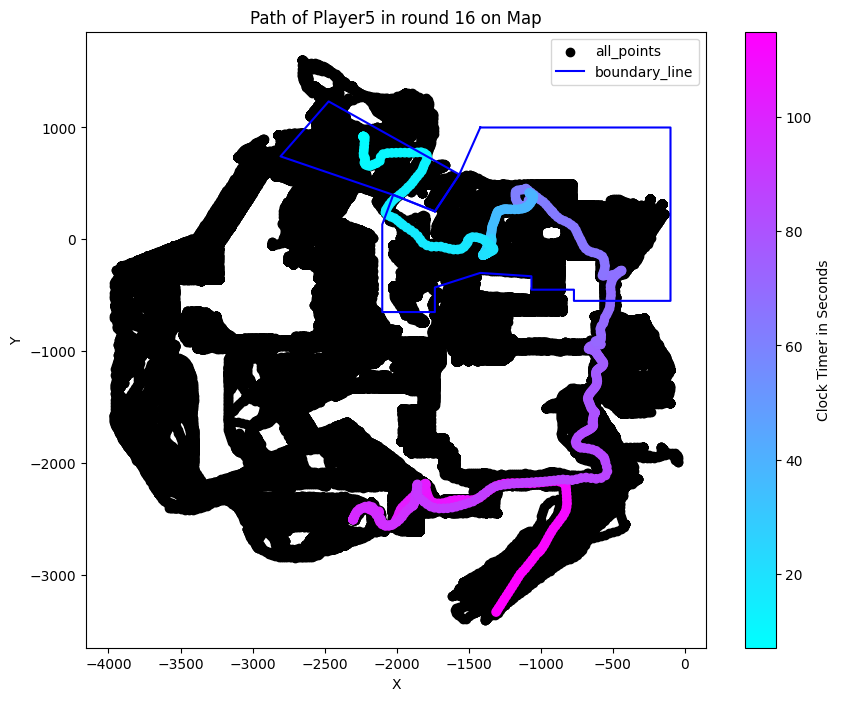

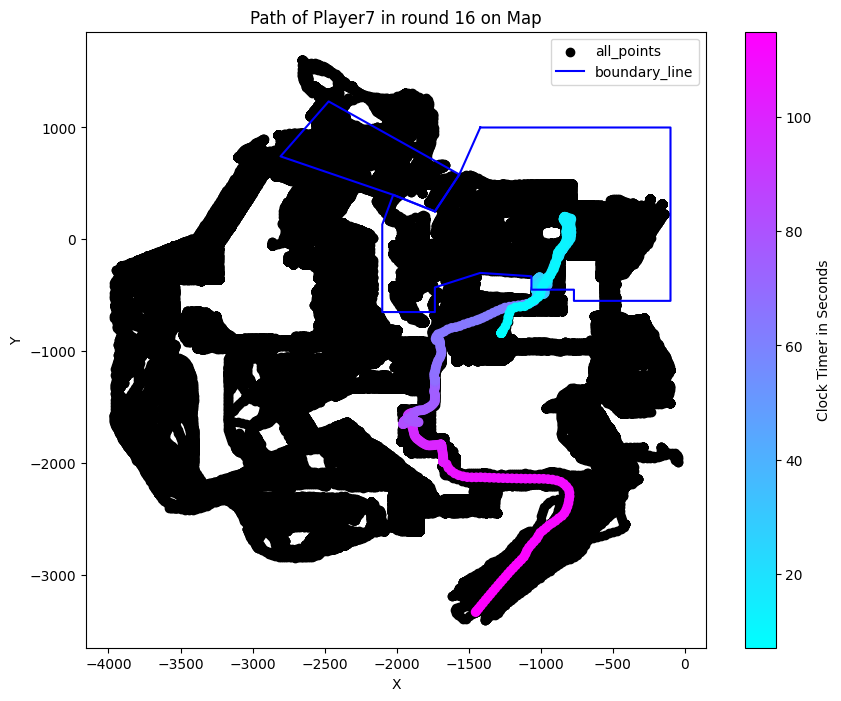

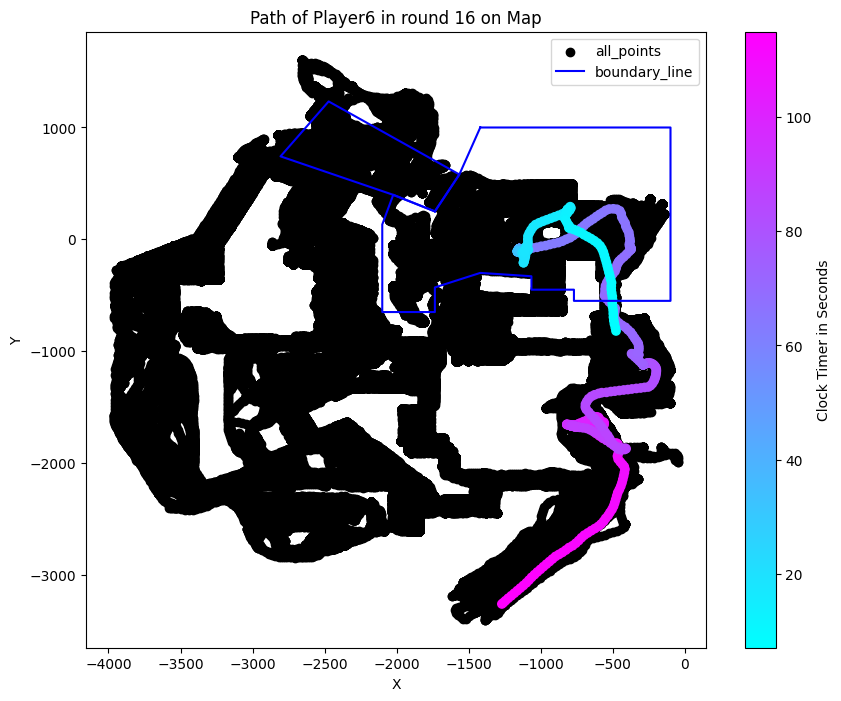

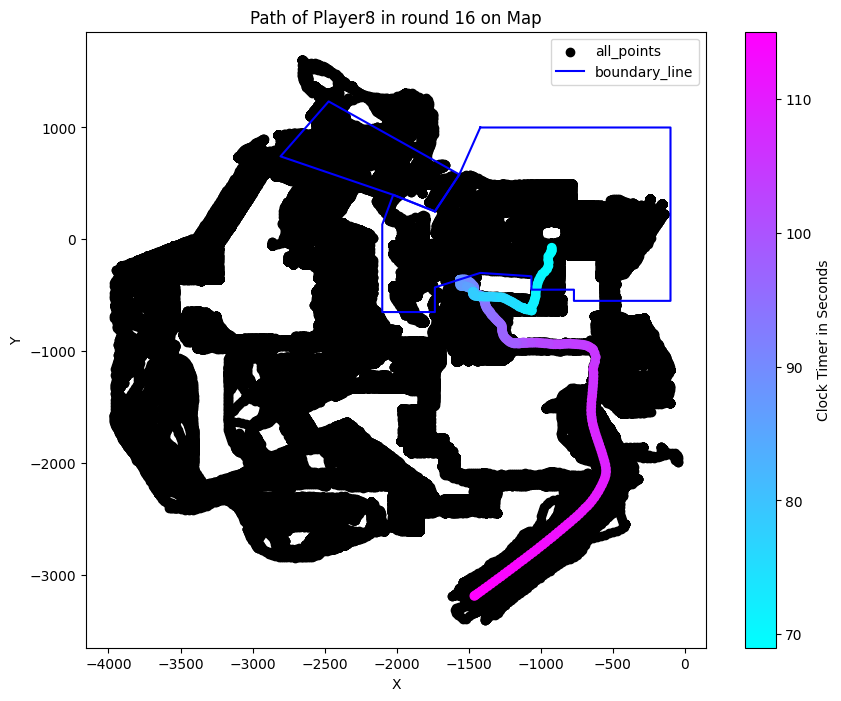

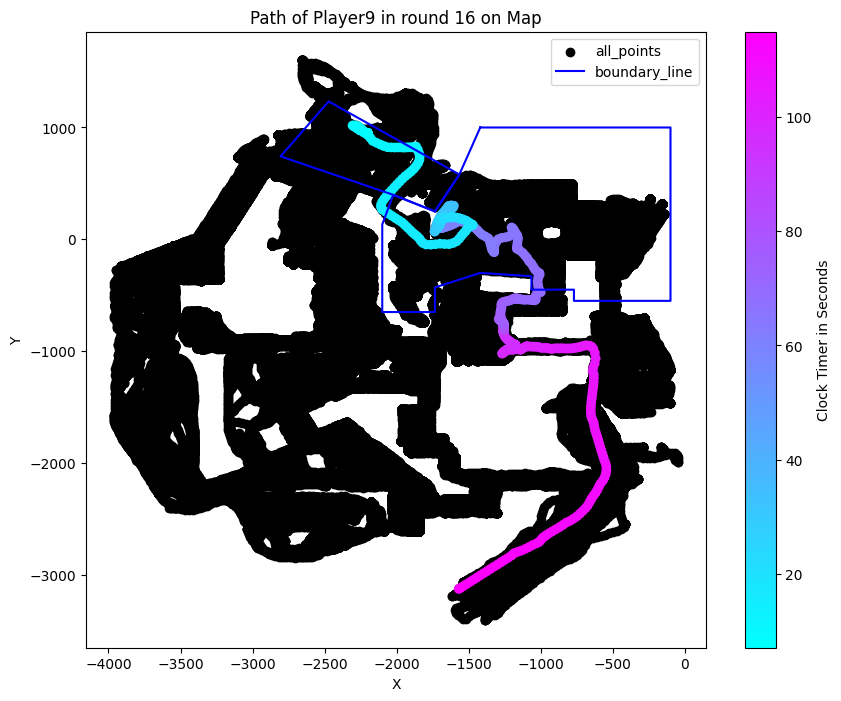

...

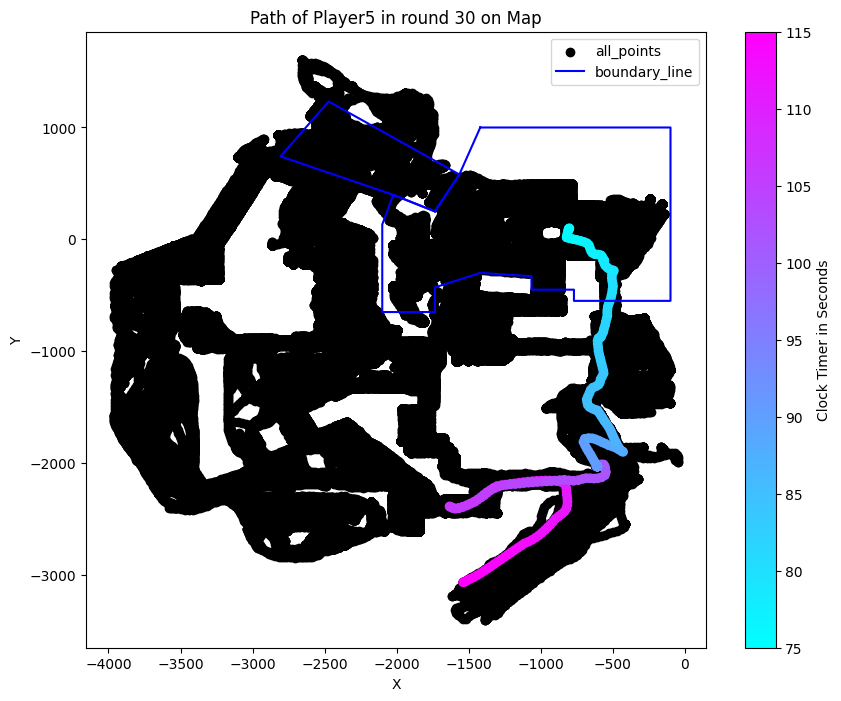

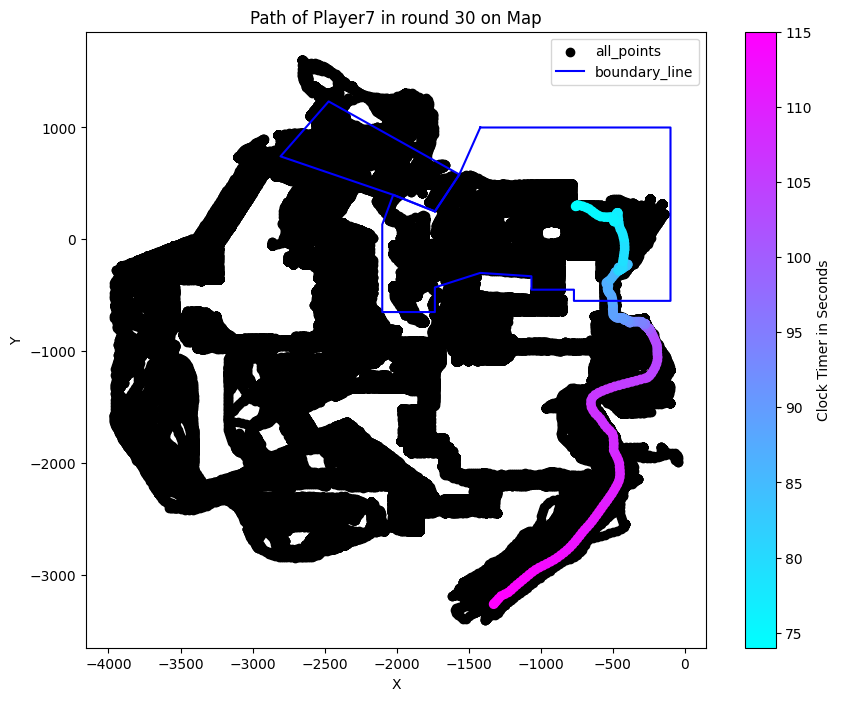

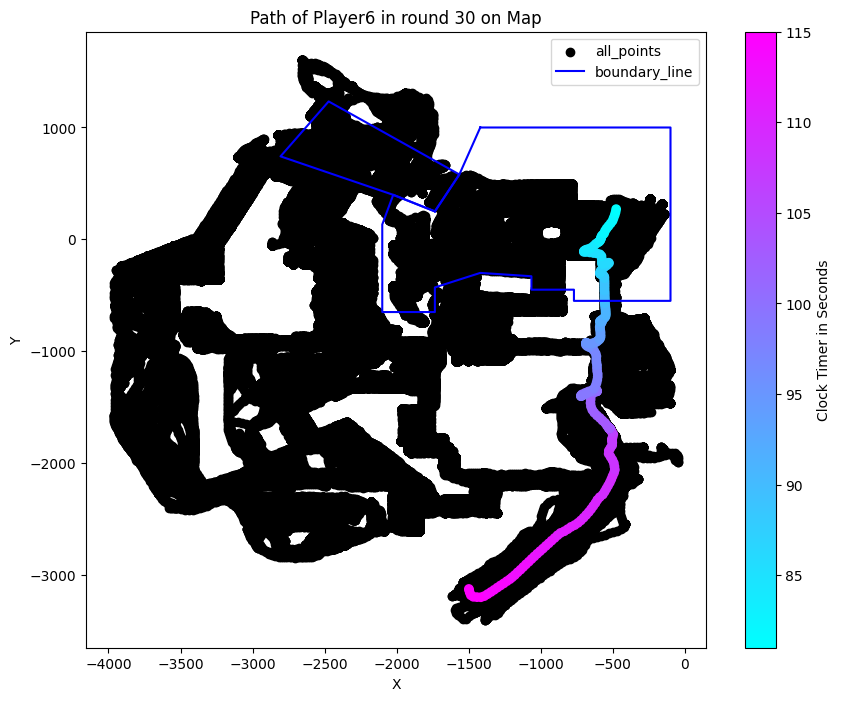

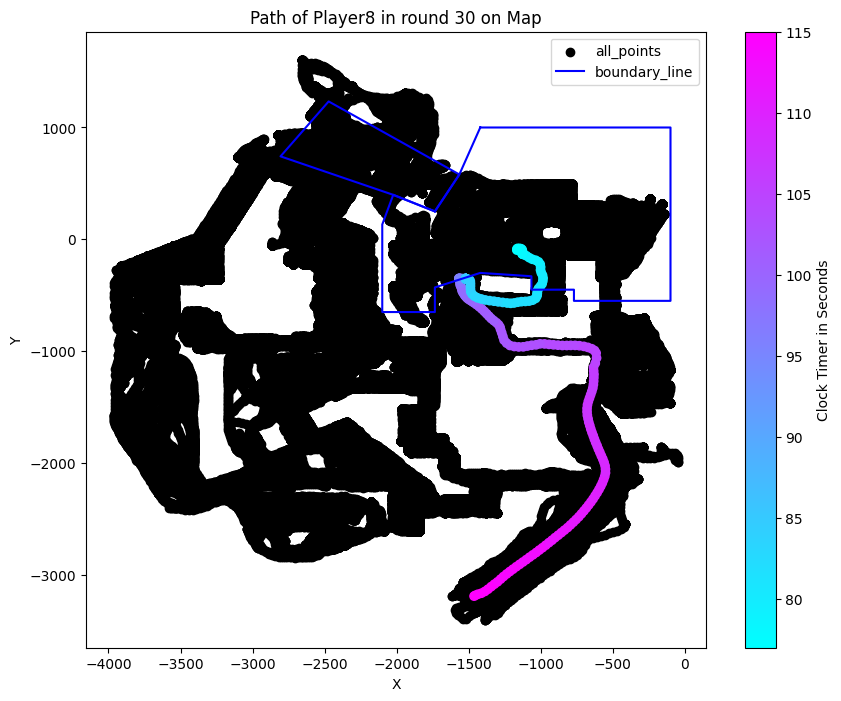

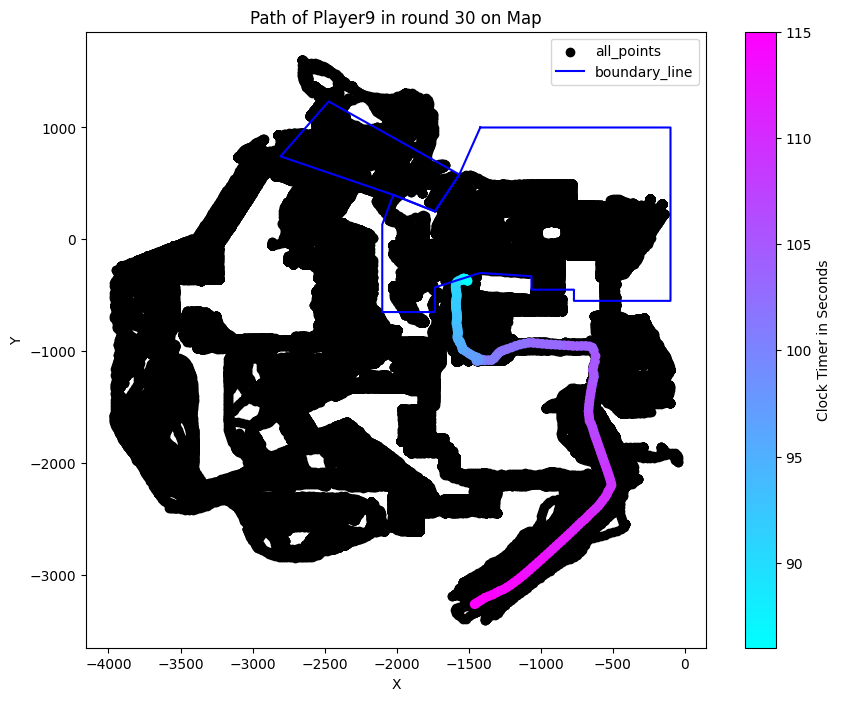

In [21]:
# for round 1 - 30
# for each player 
# for each time in ascending order
# and then shift area names up by 1...gives us the area player would be entering next
# prev second was the player in bombsiteB or next second was the player in bombsiteB
# how many times did they enter from light blue and then other times they entered from other areas

import matplotlib

condition1 = df['is_alive'] == True
condition2 = df['team'] == 'Team2'
condition3 = df['side'] == 'T'

count_light_blue = 0
count_other_areas = 0

# except 15,16
boundary_points_BombsiteB = np.array([  
  [-2024, 398],
  [-1735, 250],
  [-1565, 580],
  [-1420, 1000],
  [-100, 1000],
  [-100, -550],
  [-770, -550],
  [-770, -450],
  [-1065, -450],
  [-1065, -330],
  [-1420, -300],
  [-1735, -430],
  [-1735, -650],
  [-2100, -650],
  [-2100, 133]
     ])

boundary_path_dark_blue = mpl_path.Path(boundary_points_BombsiteB)
result = df[condition1 & condition2 & condition3 ]

for round in result['round_num'].unique():
  round_wise = result[result['round_num'] == round]
  
  for player in round_wise['player'].unique():
    player_wise = round_wise[round_wise['player']==player]

    sorted_time = player_wise.sort_values('tick')

    sorted_time['next_coordinate'] = sorted_time['coordinates'].shift(-1)
    sorted_time = sorted_time[:-1]
    sorted_time['next_second'] = sorted_time['next_coordinate'].apply(lambda point: boundary_path_dark_blue.contains_point(point))
    
    for index, row in sorted_time.iterrows():

      if row['within_boundary']==True and row['next_second']==True:
        count_light_blue += 1
      
      elif boundary_path_dark_blue.contains_point(row['coordinates'])!=True and row['next_second']==True:
        count_other_areas += 1

    sorted_time['map_val'] = sorted_time['clock_time'].apply(lambda x: int(x.split(':')[0]) * 60 + int(x.split(':')[1]))

    fig2, ax2 = plt.subplots(figsize=(10, 8)) 

    ax2.scatter(df['x'], df['y'], color='black', label='all_points')
    cmap = matplotlib.colormaps['cool']
    scatter=ax2.scatter(sorted_time['x'], sorted_time['y'], c=sorted_time['map_val'], cmap=cmap)
    ax2.plot(x+x[:1], y+y[:1], color='blue', label='boundary_line')
    ax2.plot(xnv, ynv, color='blue')

    cbar = plt.colorbar(scatter)
    cbar.set_label('Clock Timer in Seconds')
    ax2.set_xlabel('X')
    ax2.set_ylabel('Y')
    map_title = 'Path of '+player+' in round '+str(round) +' on Map'
    ax2.set_title(map_title)
    ax2.legend()
    fig2.show()

print('Number of Team 2 T side inside the light blue boundary:',len(result[result['within_boundary']==True]))
print('Number of times a player from team2 T side enters the dark blue boundary via light blue boundary area',count_light_blue)
print('Number of times a player from team2 T side enters the dark blue boundary via any other area except the light blue boundary area: ',count_other_areas)

<h2> Question 2: b </h2>

<h4>
What is the average timer that Team2 on T (terrorist) side enters
“BombsiteB” with least 2 rifles or SMGs?
</h4>

**Approach:**
<h4>

*   Figure out T from Team2 who are alive and their location(coordiantes) currently outide BombsiteB.
*   For every round keep track of players moving in and out of BombsiteB so that we can check if team 2 T side has least 2 rifle or SMGs while entering.
*  When any player on team 2 T side enters BombsiteB with ammo more than the given condition note the clock timer.
*   Get averages for a every round, then get a combined average.

</h4>

In [22]:
# use result df same as q2 a
# use similar strategy as above; go round wise; sort time ticks; 
# track if exits then reduce ammo; if enter increase ammo, if enter with proper number of ammo then consider for avg timer
# get avg of rounds; then overall avg

condition1 = df['is_alive'] == True
condition2 = df['team'] == 'Team2'
condition3 = df['side'] == 'T'
result = df[condition1 & condition2 & condition3 ]

counters = []

for i in range(1,31):
  round_wise = result[result['round_num'] == i]

  combined_df = pd.DataFrame()

  for player in round_wise['player'].unique():
    player_wise = round_wise[round_wise['player']==player]

    sorted_time = player_wise.sort_values('tick')
    
    sorted_time['next_area'] = sorted_time['area_name'].shift(-1)
    sorted_time = sorted_time[:-1]
    sorted_time['target_location'] = sorted_time['next_area'] == 'BombsiteB'
    combined_df = pd.concat([combined_df, sorted_time])

  if 'tick' in combined_df.columns:
    combined_df = combined_df.sort_values('tick')
    weapon_count = {'Rifle':0, 'SMG':0}
    round_counter = 0
    people_counter = 0

    for index, row in combined_df.iterrows():

      if row['area_name']!='BombsiteB' and row['target_location']==True:
        if 'SMG' in row['weapons']:
          weapon_count['SMG'] += 1

        if 'Rifle' in row['weapons']: 
          weapon_count['Rifle'] += 1

        if weapon_count['Rifle'] >=2 or weapon_count['SMG'] >= 2:
          people_counter += 1 
          round_counter += int(row['clock_time'].split(':')[0]) * 60 + int(row['clock_time'].split(':')[1])

      elif row['area_name']=='BombsiteB' and row['target_location']!=True:
        if 'SMG' in row['weapons'] and weapon_count['SMG']>0 :
          weapon_count['SMG'] -= 1

        if 'Rifle' in row['weapons'] and weapon_count['Rifle']>0: 
          weapon_count['Rifle'] -= 1

    if people_counter!=0:  
      counters.append(round_counter/people_counter)

print('Average clcok timer in seconds across different rounds:',counters)
print('Overall average timer in minutes that Team2 on T (terrorist) side enters “BombsiteB” with least 2 rifles or SMGs:',(sum(counters)/len(counters))/60)



Average clcok timer in seconds across different rounds: [95.0, 72.54545454545455, 75.0]
Overall average timer in minutes that Team2 on T (terrorist) side enters “BombsiteB” with least 2 rifles or SMGs: 1.3474747474747477


<h2> Question 2: c </h2>

<h4>
Now that we’ve gathered data on Team2 T side, let's examine their CT
(counter-terrorist) Side. Using the same data set, tell our coaching
staff where you suspect them to be waiting inside “BombsiteB”
</h4>

**Approach:**
<h4>

*   Figure out CT from Team2 who are alive and their location(coordiantes) inside BombsiteB.
*   Make a normal heatmap of Team2 CT players in BombsiteB.

*  Plot all the points of Team2 CT players in BombsiteB overlapping all player points.
*   Plot frequency of Team2 CT players in BombsiteB overlapping all player points.

So the coordinate bins having highest frequency are the areas where we suspect them to be waiting. In this case the areas on map shaded with purple hue. For a accurate understanding of coordinate values we can check the normal heatmap
</h4>

In [23]:
condition1 = df['is_alive'] == True
condition2 = df['team'] == 'Team2'
condition3 = df['side'] == 'CT'
condition4 = df['area_name'] == 'BombsiteB'

CT_result = df[condition1 & condition2 & condition3 & condition4]

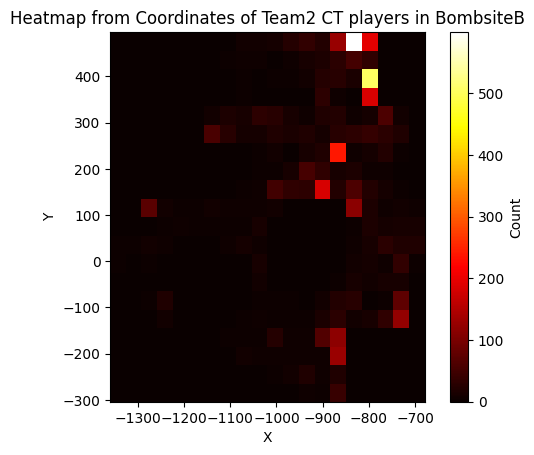

In [24]:
heatmap, xedges, yedges = np.histogram2d(CT_result['x'], CT_result['y'], bins=20)

plt.imshow(heatmap.T, origin='lower', extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]], cmap='hot')
plt.colorbar(label='Count')

plt.xlabel('X')
plt.ylabel('Y')
plt.title('Heatmap from Coordinates of Team2 CT players in BombsiteB')
plt.show()

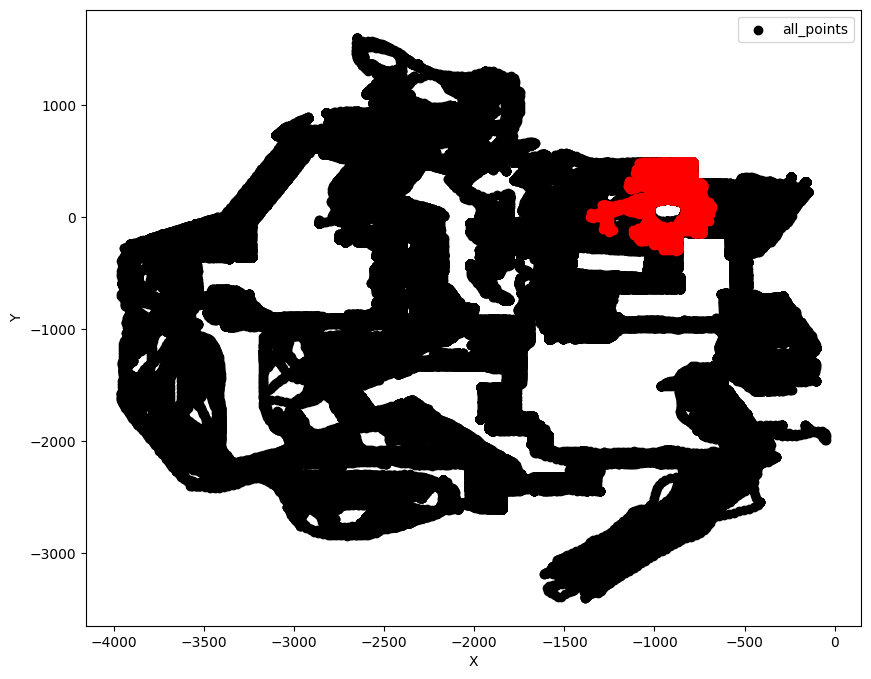

In [25]:
fig2, ax2 = plt.subplots(figsize=(10, 8)) 

ax2.scatter(df['x'], df['y'], color='black', label='all_points')
ax2.scatter(CT_result['x'], CT_result['y'], color='red')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax1.set_title('Plot of Team2 CT players in BombsiteB overlapping all player points on the Whole Map')
ax2.legend()
fig2.show()

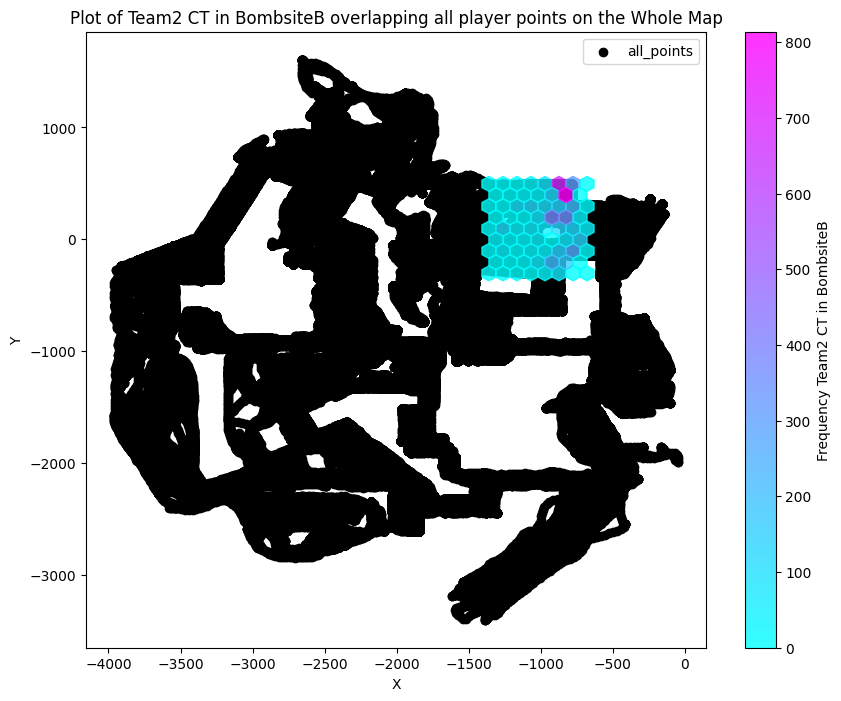

In [26]:
fig2, ax2 = plt.subplots(figsize=(10, 8)) 

ax2.scatter(df['x'], df['y'], color='black', label='all_points')
plt.hexbin(CT_result['x'], CT_result['y'], gridsize=7, cmap='cool', alpha=0.8)
plt.colorbar(label='Frequency Team2 CT in BombsiteB')
ax2.set_xlabel('X')
ax2.set_ylabel('Y')
ax2.set_title('Plot of Team2 CT in BombsiteB overlapping all player points on the Whole Map')
ax2.legend()
fig2.show()

<h2> Question 3: </h2>

<h4>
Most of the time, our stakeholders (in this case, the CS:GO
coaching staff) aren’t tech-savvy enough to run code themselves. Propose a
solution to your product manager that:

1. could allow our coaching staff to request or acquire the output themselves
2. takes less than 1 weeks worth of work to implement
</h4>

**Solution:**
<h4>
Develop a web-based dashboard allowing coaching staff to request and acquire analysis output themselves.

Steps for the Dashboard:-
1. Design UI: Create a user-friendly interface. This involves wireframing, prototyping, and designing the layout, navigation, and components of the dashboard.

2. Develop Frontend: Implement the frontend of the dashboard. This involves coding the UI components.

3. Develop Backend: Build the backend of the dashboard. Set up a server to handle incoming requests, process data, and interact with the database. 

4. Convert Analysis to APIs: Convert the analysis code into reusable APIs to ensure ease of use and seamless integration with the dashboard. 

5. Provide Statistics and Visual Displays: Enhance the dashboard's functionality by incorporating statistical analysis and visual displays. So that better understanding and insights are provided for the analyzed data.

6. Test and Deploy: Thoroughly test the dashboard to ensure its functionality, responsiveness, and compatibility across different devices and browsers. Conduct both unit testing and end-to-end testing to identify and fix any bugs or issues. Once testing is complete, deploy the dashboard to a production environment.

To build this React/Angular and Node.js tech stack can be used as they offers offer excellent responsiveness, flexibility, and a wide range of libraries and tools that can facilitate data analysis and visualization in the dashboard.

Some of the features Dashboard can have:-

- Player Performance Metrics: Display individual player performance metrics such as kill-death ratio (K/D), headshot percentage, accuracy, and other relevant statistics.

- Heatmaps and Pathing: Visualize player movement patterns and heatmap overlays on game maps to identify popular routes, high-traffic areas, and strategic positions. 

- Weapon Usage and Efficiency: Display weapon usage statistics, including the most frequently used weapons and their effectiveness. 

- Team Performance Analytics: Provide team-level performance analytics such as win/loss ratio, round win percentage and map control.

- Player Comparisons: Enable comparisons between players or teams based on various performance metrics.

- Real-time Data Integration: Integrate with live match data feeds or APIs to provide real-time updates during ongoing matches.

- Tactical Analysis: Allow coaches to annotate gameplay videos and add notes or comments on specific rounds, player actions, or team strategies. 

With a proper balanced team for development most of this features with a working dashboard can be done within a week.
</h4>